# Import Library
You will need to load all necessary libraries related to TensorFlow and Keras.

Keep in mind that **import keras** is different than **import tensorflow**, so always put **import tensorflow.kears** to make sure you are importing the correct function.

In [1]:
import os

import tensorflow as tf
#import tensorflow.keras as keras
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.python.keras.engine.training import Model
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.python.keras.layers import Add, Dropout, Flatten, Dense, Activation, Conv2D,GlobalAveragePooling2D, MaxPooling2D
from tensorflow.python.keras.layers.normalization import BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# AWS S3 and file manager
import boto3
import s3fs

from sklearn.model_selection import train_test_split

from PIL import Image
import cv2

# Reading Images from S3

In [2]:
s3 =  boto3.resource('s3', region_name='us-east-1')
bucket = s3.Bucket('cap3-hailin-du')

In [3]:
fs = s3fs.S3FileSystem()

In [ ]:
# assign folder path & label
BASEPATH = fs.ls('s3://cap3-hailin-du/Images')
LABELS = set()
paths = []
for d in BASEPATH:
    x = d.split('/')
    LABELS.add(x[2])
    paths.append((d,x[2]))

In [5]:
# checking
s = 'cap3-hailin-du/Images/n02085620-Chihuahua/n02085620_10074.jpg'
x = s.split('/')
print(x[0])
y = x[1] + '/' + x[2] + '/' + x[3]
print(y)
print(x[2])

cap3-hailin-du
Images/n02085620-Chihuahua/n02085620_10074.jpg
n02085620-Chihuahua


# Resizing Images and Download the Images

Since we cannot read images directly from the S3 bucket, we will resize the images and download them in our notebook.

After that, we will have the images locally or in SageMaker. Keep in mind that if you download the images directly they are in your root folder. Create a folder to store associated images with the correct folder name first.

In order to begin our project, we will need to create a dataframe that includes the path of images and associated labels.

In [6]:
# Download images
def load_image(path):
    location = path.split('/')
    bucket = s3.Bucket(location[0])
    object = bucket.Object(location[1] + '/' + location[2] + '/' + location[3])
    object.download_file(location[3])
    image = cv2.imread(location[3])
    image = cv2.resize(image, (224, 224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [7]:
# Create dataframe for images path and labels
def generate_df(path):
    location = path.split('/')
    return pd.DataFrame({'image_path':[location[5] + '/' + location[6]],
                         'breed':[location[5]]})

In [8]:
BASEPATH = '/home/ec2-user/SageMaker/Images/'

files = os.listdir(BASEPATH)

LABELS = set()
paths = []
for f in files:
    y = f.split('-')
    LABELS.add(f)
    paths.append((BASEPATH + f, y))

In [9]:
paths[:5]

[('/home/ec2-user/SageMaker/Images/n02108089-boxer', ['n02108089', 'boxer']),
 ('/home/ec2-user/SageMaker/Images/n02113799-standard_poodle',
  ['n02113799', 'standard_poodle']),
 ('/home/ec2-user/SageMaker/Images/n02107683-Bernese_mountain_dog',
  ['n02107683', 'Bernese_mountain_dog']),
 ('/home/ec2-user/SageMaker/Images/n02094433-Yorkshire_terrier',
  ['n02094433', 'Yorkshire_terrier']),
 ('/home/ec2-user/SageMaker/Images/n02096437-Dandie_Dinmont',
  ['n02096437', 'Dandie_Dinmont'])]

In [10]:
# use folder name as breed label
X, y = [], []
i = 0
image = []
for path, label in paths:
    for image_path in os.listdir(path):
        image.append(generate_df(path + '/' + image_path))

In [11]:
image = pd.concat(image)

In [12]:
image.head()

,image_path,breed
0,n02108089-boxer/n02108089_11616.jpg,n02108089-boxer
0,n02108089-boxer/n02108089_9045.jpg,n02108089-boxer
0,n02108089-boxer/n02108089_9076.jpg,n02108089-boxer
0,n02108089-boxer/n02108089_3028.jpg,n02108089-boxer
0,n02108089-boxer/n02108089_3162.jpg,n02108089-boxer


In [13]:
# clean the label
image['breed'] = image['breed'].apply(lambda x: x.split('-')[1])

In [14]:
image.head()

,image_path,breed
0,n02108089-boxer/n02108089_11616.jpg,boxer
0,n02108089-boxer/n02108089_9045.jpg,boxer
0,n02108089-boxer/n02108089_9076.jpg,boxer
0,n02108089-boxer/n02108089_3028.jpg,boxer
0,n02108089-boxer/n02108089_3162.jpg,boxer


In [16]:
# to correct some label names
image['breed'] = image['breed'].replace(['black'],'black_and_tan_coonhound')
image['breed'] = image['breed'].replace(['wire'],'wire_fox_terrier')
image['breed'] = image['breed'].replace(['soft'],'soft_coated_wheaten_terrier')
image['breed'] = image['breed'].replace(['flat'],'flat_coated_retriever')
image['breed'] = image['breed'].replace(['curly'],'curly_coated_retriever')
image['breed'] = image['breed'].replace(['German_short'],'German_shorthaired_pointer')

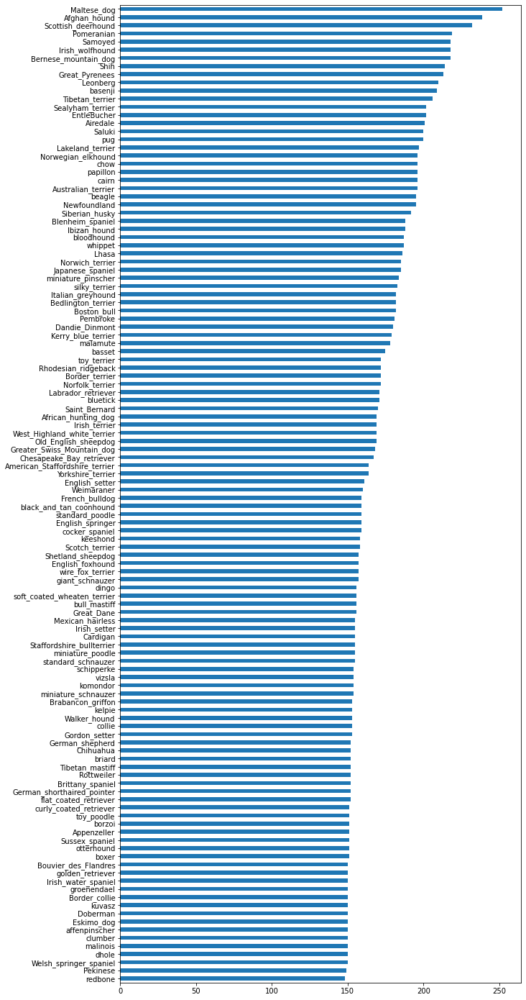

In [17]:
image['breed'].value_counts().sort_values(ascending=True).plot.barh(figsize=(10,25));

In [18]:
image.breed.unique()

array(['boxer', 'standard_poodle', 'Bernese_mountain_dog',
       'Yorkshire_terrier', 'Dandie_Dinmont', 'Mexican_hairless',
       'Rottweiler', 'bull_mastiff', 'Tibetan_mastiff', 'collie',
       'vizsla', 'clumber', 'curly_coated_retriever', 'Sussex_spaniel',
       'kelpie', 'miniature_schnauzer', 'briard', 'basset',
       'Brabancon_griffon', 'otterhound', 'Brittany_spaniel',
       'Great_Dane', 'bloodhound', 'Irish_setter', 'Japanese_spaniel',
       'German_shepherd', 'Siberian_husky', 'Pekinese',
       'Bedlington_terrier', 'schipperke', 'Greater_Swiss_Mountain_dog',
       'EntleBucher', 'Maltese_dog', 'Appenzeller', 'whippet', 'Lhasa',
       'Saint_Bernard', 'Cardigan', 'Italian_greyhound',
       'Irish_water_spaniel', 'malamute', 'silky_terrier', 'dhole',
       'Bouvier_des_Flandres', 'Shetland_sheepdog', 'Irish_terrier',
       'Irish_wolfhound', 'Pomeranian', 'toy_poodle', 'redbone',
       'Chesapeake_Bay_retriever', 'Saluki', 'Norfolk_terrier',
       'Rhodesian_ri

# Create Second Labels "Groups" for Images

The dataset only has images with associated breed labels. We will use the American Kennel Club's [List of Breeds by Group](https://www.akc.org/public-education/resources/general-tips-information/dog-breeds-sorted-groups/) information to create 9 labels for groups.

In [19]:
image.loc[(image['breed'] == 'Chihuahua')
          |(image['breed'] == 'Japanese_spaniel')
          |(image['breed'] == 'Maltese_dog')
          |(image['breed'] == 'Pekinese')
          |(image['breed'] == 'Shih')
          |(image['breed'] == 'Blenheim')
          |(image['breed'] == 'papillon')
          |(image['breed'] == 'toy_terrier')
          |(image['breed'] == 'Yorkshire_terrier')
          |(image['breed'] == 'silky_terrier')
          |(image['breed'] == 'soft_coated_wheaten_terrier')
          |(image['breed'] == 'miniature_pinscher')
          |(image['breed'] == 'affenpinscher')
          |(image['breed'] == 'pug')
          |(image['breed'] == 'Pomeranian')
          |(image['breed'] == 'Brabancon_griffon')
          |(image['breed'] == 'toy_poodle')
          |(image['breed'] == 'Blenheim_spaniel'),
          'group'] = 'Toy'

image.loc[(image['breed'] == 'Rhodesian_ridgeback')
          |(image['breed'] == 'Afghan_hound')
          |(image['breed'] == 'basset')
          |(image['breed'] == 'beagle')
          |(image['breed'] == 'bloodhound')
          |(image['breed'] == 'bluetick')
          |(image['breed'] == 'black_and_tan_coonhound')
          |(image['breed'] == 'Walker_hound')
          |(image['breed'] == 'English_foxhound')
          |(image['breed'] == 'redbone')
          |(image['breed'] == 'borzoi')
          |(image['breed'] == 'Irish_wolfhound')
          |(image['breed'] == 'Italian_greyhound')
          |(image['breed'] == 'whippet')
          |(image['breed'] == 'Ibizan_hound')
          |(image['breed'] == 'Norwegian_elkhound')
          |(image['breed'] == 'otterhound')          
          |(image['breed'] == 'Saluki')
          |(image['breed'] == 'Scottish_deerhound')
          |(image['breed'] == 'basenji'),
          'group'] = 'Hound'

image.loc[(image['breed'] == 'Weimaraner')
          |(image['breed'] == 'flat_coated_retriever')          
          |(image['breed'] == 'curly_coated_retriever')
          |(image['breed'] == 'golden_retriever')          
          |(image['breed'] == 'Labrador_retriever')
          |(image['breed'] == 'Chesapeake_Bay_retriever')          
          |(image['breed'] == 'German_shorthaired_pointer')
          |(image['breed'] == 'English_setter')          
          |(image['breed'] == 'Irish_setter')          
          |(image['breed'] == 'Gordon_setter')          
          |(image['breed'] == 'Brittany_spaniel')
          |(image['breed'] == 'clumber')          
          |(image['breed'] == 'English_springer')
          |(image['breed'] == 'Welsh_springer_spaniel')          
          |(image['breed'] == 'cocker_spaniel')
          |(image['breed'] == 'Sussex_spaniel')          
          |(image['breed'] == 'Irish_water_spaniel')
          |(image['breed'] == 'Irish_setter')          
          |(image['breed'] == 'Gordon_setter')          
          |(image['breed'] == 'Brittany_spaniel')
          |(image['breed'] == 'clumber')          
          |(image['breed'] == 'English_springer')
          |(image['breed'] == 'Welsh_springer_spaniel')          
          |(image['breed'] == 'cocker_spaniel')
          |(image['breed'] == 'Sussex_spaniel')          
          |(image['breed'] == 'Irish_water_spaniel')
          |(image['breed'] == 'vizsla'),
          'group'] = 'Sporting'
        
image.loc[(image['breed'] == 'Staffordshire_bullterrier')
          |(image['breed'] == 'American_Staffordshire_terrier')
          |(image['breed'] == 'Bedlington_terrier')
          |(image['breed'] == 'Border_terrier')
          |(image['breed'] == 'Norwich_terrier')
          |(image['breed'] == 'wire_fox_terrier')
          |(image['breed'] == 'Lakeland_terrier')
          |(image['breed'] == 'Sealyham_terrier')
          |(image['breed'] == 'Airedale')
          |(image['breed'] == 'cairn')
          |(image['breed'] == 'Australian_terrier')
          |(image['breed'] == 'Dandie_Dinmont')
          |(image['breed'] == 'Boston_bull')
          |(image['breed'] == 'miniature_schnauzer')
          |(image['breed'] == 'Scotch_terrier')
          |(image['breed'] == 'West_Highland_white_terrier')
          |(image['breed'] == 'Kerry_blue_terrier')
          |(image['breed'] == 'Norfolk_terrier')
          |(image['breed'] == 'Irish_terrier'),
          'group'] = 'Terrier'

image.loc[(image['breed'] == 'giant_schnauzer')
          |(image['breed'] == 'standard_schnauzer')
          |(image['breed'] == 'kuvasz')      
          |(image['breed'] == 'komondor')
          |(image['breed'] == 'Rottweiler')          
          |(image['breed'] == 'Doberman')
          |(image['breed'] == 'Greater_Swiss_Mountain_dog')
          |(image['breed'] == 'Bernese_mountain_dog')
          |(image['breed'] == 'boxer')      
          |(image['breed'] == 'bull_mastiff')
          |(image['breed'] == 'Tibetan_mastiff')          
          |(image['breed'] == 'Great_Dane')
          |(image['breed'] == 'Saint_Bernard')          
          |(image['breed'] == 'malamute')  
          |(image['breed'] == 'Siberian_husky')          
          |(image['breed'] == 'Leonberg')            
          |(image['breed'] == 'Newfoundland')          
          |(image['breed'] == 'Great_Pyrenees')   
          |(image['breed'] == 'Samoyed'),
          'group'] = 'Working'

image.loc[(image['breed'] == 'Tibetan_terrier')
          |(image['breed'] == 'Lhasa') 
          |(image['breed'] == 'schipperke')
          |(image['breed'] == 'Eskimo_dog')
          |(image['breed'] == 'French_bulldog')
          |(image['breed'] == 'chow')
          |(image['breed'] == 'keeshond')
          |(image['breed'] == 'miniature_poodle')
          |(image['breed'] == 'standard_poodle'),
          'group'] = 'Non-Sporting'

image.loc[(image['breed'] == 'groenendael')
          |(image['breed'] == 'malinois') 
          |(image['breed'] == 'briard')
          |(image['breed'] == 'Old_English_sheepdog') 
          |(image['breed'] == 'Shetland_sheepdog') 
          |(image['breed'] == 'collie')
          |(image['breed'] == 'Border_collie')           
          |(image['breed'] == 'Bouvier_des_Flandres') 
          |(image['breed'] == 'briard')
          |(image['breed'] == 'German_shepherd') 
          |(image['breed'] == 'Shetland_sheepdog') 
          |(image['breed'] == 'collie')
          |(image['breed'] == 'Border_collie')        
          |(image['breed'] == 'EntleBucher')        
          |(image['breed'] == 'Pembroke')        
          |(image['breed'] == 'Cardigan'),
          'group'] = 'Herding'

image.loc[(image['breed'] == 'kelpie')
          |(image['breed'] == 'Appenzeller')          
          |(image['breed'] == 'Mexican_hairless'),
          'group'] = 'Rare'

image.loc[(image['breed'] == 'dingo')
          |(image['breed'] == 'dhole')          
          |(image['breed'] == 'African_hunting_dog'),         
          'group'] = 'Wild'

In [20]:
image.groupby(['group']).agg(['count'])

,image_path,breed
,count,count
group,,
Herding,1921,1921
Hound,3670,3670
Non-Sporting,1523,1523
Rare,459,459
Sporting,2797,2797
Terrier,3370,3370
Toy,3068,3068
Wild,475,475


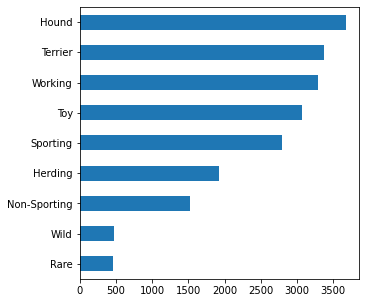

In [21]:
image['group'].value_counts().sort_values(ascending=True).plot.barh(figsize=(5,5));

In [22]:
# check any puppy without group label
image['group'].isnull().values.any()

False

In [23]:
image.group.unique()

array(['Working', 'Non-Sporting', 'Toy', 'Terrier', 'Rare', 'Herding',
       'Sporting', 'Hound', 'Wild'], dtype=object)

In [24]:
# check we can read the image
jup_path = '/home/ec2-user/SageMaker/Images/n02085620-Chihuahua/n02085620_1073.jpg'

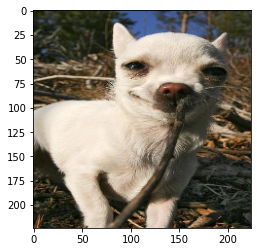

In [25]:
test = cv2.imread(jup_path)
test = cv2.resize(test, (224, 224))
test = cv2.cvtColor(test, cv2.COLOR_BGR2RGB)
imgplot = plt.imshow(test)
plt.show(imgplot)

# Preprocessing 

Before we begin building our CNN model, we will need to convert the dataframe into a form that the model can read the images. using ImageDataGenerator.

In [26]:
# split dataset
train_df, test_df = train_test_split(image,test_size=0.25)

In [27]:
# rescale the images
train_datagen = ImageDataGenerator(
        rescale=1 / 255.0,
        rotation_range=20,
        zoom_range=0.05,
        width_shift_range=0.05,
        height_shift_range=0.05,
        shear_range=0.05,
        horizontal_flip=True,
        fill_mode="nearest",
        validation_split=0.20)
test_datagen = ImageDataGenerator(rescale=1 / 255.0)

In [28]:
os.getcwd()

'/home/ec2-user/SageMaker'

In [29]:
image.head()

,image_path,breed,group
0,n02108089-boxer/n02108089_11616.jpg,boxer,Working
0,n02108089-boxer/n02108089_9045.jpg,boxer,Working
0,n02108089-boxer/n02108089_9076.jpg,boxer,Working
0,n02108089-boxer/n02108089_3028.jpg,boxer,Working
0,n02108089-boxer/n02108089_3162.jpg,boxer,Working


# Split the data into three groups to fit the model

We will split the data into three groups, which are training, validation, and test dataset. We also set some parameters, such as the **batch_size** is 8. 

In each generator, the data is now being split into X column (image_path) and Y column (breed).

In [32]:
batch_size = 8
jup_path = '/home/ec2-user/SageMaker/Images/'
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=jup_path,
    x_col="image_path",
    y_col="breed",
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode="categorical",
    subset='training',
    shuffle=True,
    seed=42
)
valid_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=jup_path,
    x_col="image_path",
    y_col="breed",
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode="categorical",
    subset='validation',
    shuffle=True,
    seed=42
)
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    directory=jup_path,
    x_col="image_path",
    target_size=(224, 224),
    batch_size=1,
    class_mode=None,
    shuffle=False,
)

Found 12347 validated image filenames belonging to 120 classes.
Found 3086 validated image filenames belonging to 120 classes.
Found 5145 validated image filenames.


# Convolutional Neural Network (CNN) Model

We will build our CNN model, keep in mnid that the **input_shape** and the **model.add(Dense(120, activation='softmax'))** are something you should pay attention to.

The input_shape is related to your image size, and the last layer is related to how many labels you are going to predict. For example, 120 means a total of 120 breeds.

For other layers, we can always modify it base on personal preference. These layers are related to how to train (how neural network connect) the model.

The last step is to train the model with the number of **EPOCH** you want to run.

In [587]:
# CNN Model
model = Sequential()

model.add(Conv2D(16, (3, 3), padding='same', use_bias=False, input_shape=(224, 224, 3)))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model.add(Dropout(0.2))

model.add(Conv2D(32, (3, 3), padding='same', use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model.add(Dropout(0.2))

model.add(Conv2D(64, (3, 3), padding='same', use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model.add(Dropout(0.2))

model.add(Conv2D(128, (3, 3), padding='same', use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation("relu"))
model.add(Flatten())
model.add(Dropout(0.2))

model.add(Dense(512, activation='relu'))
model.add(Dense(120, activation='softmax'))
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_19 (Conv2D)           (None, 224, 224, 16)      432       
_________________________________________________________________
batch_normalization_16 (Batc (None, 224, 224, 16)      48        
_________________________________________________________________
activation_16 (Activation)   (None, 224, 224, 16)      0         
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 56, 56, 16)        0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 56, 56, 16)        0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 56, 56, 32)        4608      
_________________________________________________________________
batch_normalization_17 (Batc (None, 56, 56, 32)       

In [588]:
EPOCHS = 10

checkpointer = ModelCheckpoint(filepath='/home/ec2-user/SageMaker/weights.best.from_base1.hdf5',
                               verbose=1, save_best_only=True)

model.compile(loss='categorical_crossentropy',
             optimizer='rmsprop',
             metrics=['accuracy'])

base_model = model.fit(train_generator, 
              validation_data=(train_generator),
              steps_per_epoch = train_generator.n // train_generator.batch_size,
              validation_steps = valid_generator.n // valid_generator.batch_size,
              epochs=EPOCHS, callbacks=[checkpointer], verbose=1)

Epoch 1/10
 385/1543 [======>.......................] - ETA: 1:59 - loss: 4.6129 - acc: 0.0266
Epoch 00001: val_loss improved from inf to 4.61287, saving model to /home/ec2-user/SageMaker/weights.best.from_base1.hdf5
1543/1543 [==============================] - 241s 156ms/step - loss: 4.7448 - acc: 0.0169 - val_loss: 4.6129 - val_acc: 0.0266
Epoch 2/10
 385/1543 [======>.......................] - ETA: 1:59 - loss: 4.5147 - acc: 0.0367
Epoch 00002: val_loss improved from 4.61287 to 4.51472, saving model to /home/ec2-user/SageMaker/weights.best.from_base1.hdf5
1543/1543 [==============================] - 203s 131ms/step - loss: 4.4949 - acc: 0.0298 - val_loss: 4.5147 - val_acc: 0.0367
Epoch 3/10
 385/1543 [======>.......................] - ETA: 2:02 - loss: 4.5182 - acc: 0.0260
Epoch 00003: val_loss did not improve from 4.51472
1543/1543 [==============================] - 204s 132ms/step - loss: 4.4519 - acc: 0.0337 - val_loss: 4.5182 - val_acc: 0.0260
Epoch 4/10
 385/1543 [======>......

# Checking the Performance

As we can see below, the result is pretty bad with around 3.5% accuracy, but it still outperforms random guess.

Also, the model shows a sign that we can continue to train the model to improve the accuracy by increasing the number of EPOCH. Also, we should always pay attention to the **model.compile** where you are going to select the **optimizer** and the **metrics**.

We also want to see how the confusion matrix performs.

We can always build other models and compare them with the baseline model. 

In [46]:
def report_accuracy(base_model, generator):
    score = base_model.model.evaluate_generator(generator)
    print('Loss:', score[0])
    print('Accuracy:', score[1])

In [591]:
print('For training set:')
report_accuracy(base_model, train_generator)
print('------------------')
print('For validation set:')
report_accuracy(base_model,valid_generator)

For training set:
Loss: 4.386176852364614
Accuracy: 0.03879485
------------------
For validation set:
Loss: 4.472330960585046
Accuracy: 0.034024626


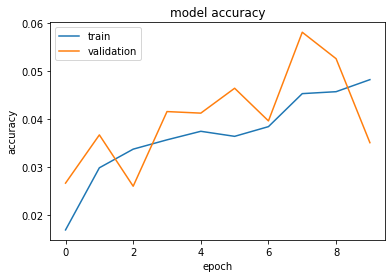

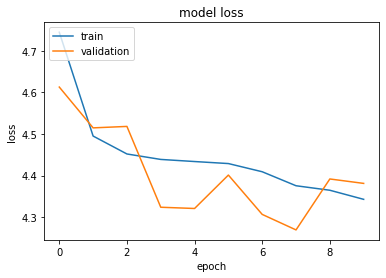

In [592]:
plt.plot(base_model.history['acc'])
plt.plot(base_model.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(base_model.history['loss'])
plt.plot(base_model.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [51]:
!pip install mlxtend

     |████████████████████████████████| 1.3 MB 19.1 MB/s eta 0:00:01


In [52]:
import mlxtend
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import classification_report, confusion_matrix

In [612]:
target = list(image.breed.unique())

In [620]:
Y_pred = model.predict_generator(valid_generator)
y_pred = np.argmax(Y_pred, axis=1)
print('Confusion Matrix')
cf = confusion_matrix(valid_generator.classes, y_pred)
print(cf)
print('Classification Report')
target_names = target
print(classification_report(valid_generator.classes, y_pred, target_names=target_names))

Confusion Matrix
[[2 0 3 ... 0 0 0]
 [0 1 2 ... 0 0 0]
 [1 0 2 ... 0 0 0]
 ...
 [0 0 4 ... 0 0 0]
 [0 0 6 ... 0 0 0]
 [0 0 4 ... 0 0 0]]
Classification Report
                                precision    recall  f1-score   support

                         boxer       0.02      0.05      0.03        42
               standard_poodle       0.25      0.04      0.07        25
          Bernese_mountain_dog       0.01      0.06      0.01        31
             Yorkshire_terrier       0.00      0.00      0.00        20
                Dandie_Dinmont       0.00      0.00      0.00        31
              Mexican_hairless       0.00      0.00      0.00        33
                    Rottweiler       0.00      0.00      0.00        28
                  bull_mastiff       0.00      0.00      0.00        28
               Tibetan_mastiff       0.00      0.00      0.00        25
                        collie       0.00      0.00      0.00        22
                        vizsla       0.00      0

/home/ec2-user/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ec2-user/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ec2-user/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

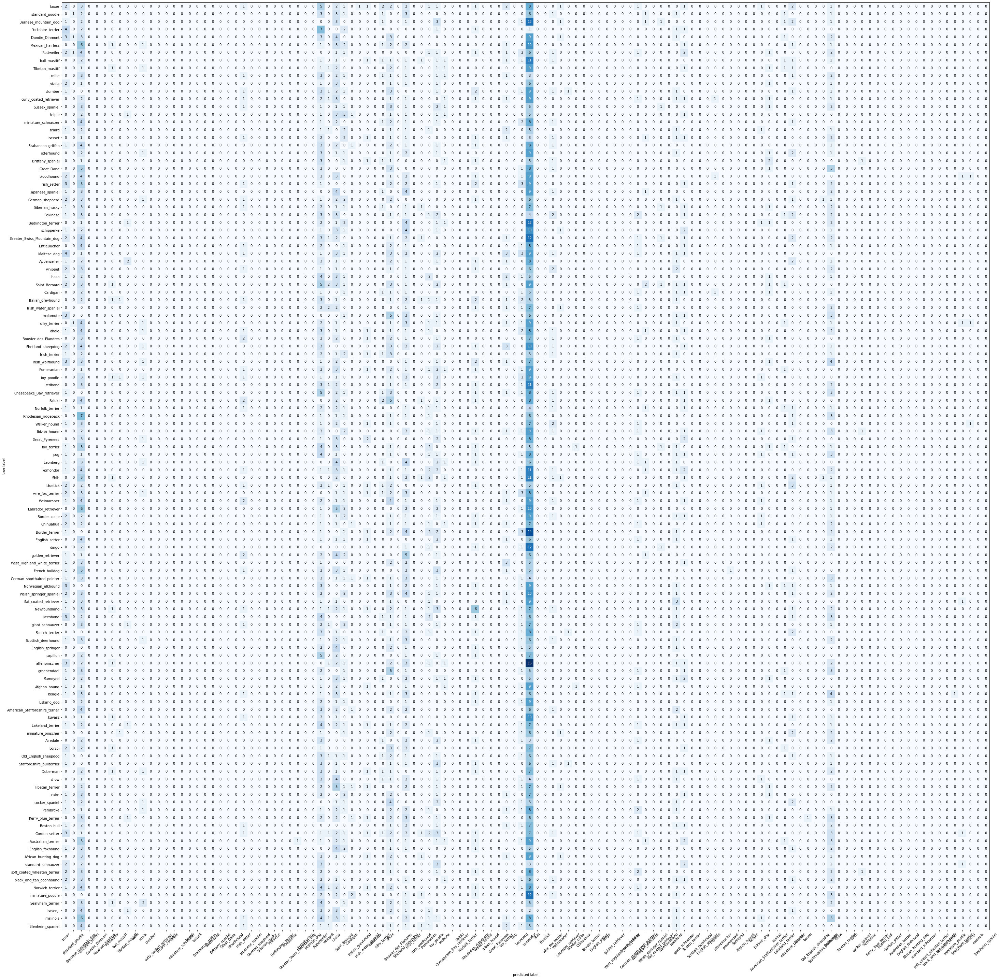

In [633]:
plot_confusion_matrix(conf_mat=cf,
                      class_names=target, 
                      figsize=(50,50));

In [634]:
# second model
model = Sequential()

model.add(Conv2D(32, (3, 3), input_shape=(224,224,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())

model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))

model.add(Dense(120))
model.add(Activation('softmax'))

model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_23 (Conv2D)           (None, 222, 222, 32)      896       
_________________________________________________________________
activation_20 (Activation)   (None, 222, 222, 32)      0         
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 109, 109, 32)      9248      
_________________________________________________________________
activation_21 (Activation)   (None, 109, 109, 32)      0         
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 54, 54, 32)        0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 52, 52, 64)       

In [635]:
EPOCHS = 10

checkpointer = ModelCheckpoint(filepath='/home/ec2-user/SageMaker/weights.best.from_base2.hdf5',
                               verbose=1, save_best_only=True)
model.compile(loss='categorical_crossentropy',
             optimizer='rmsprop',
             metrics=['accuracy'])

base_model2 = model.fit(train_generator, 
              validation_data=(train_generator),
              steps_per_epoch = train_generator.n // train_generator.batch_size,
              validation_steps = valid_generator.n // valid_generator.batch_size,
              epochs=EPOCHS, callbacks=[checkpointer], verbose=1)

Epoch 1/10
 385/1543 [======>.......................] - ETA: 2:02 - loss: 4.7793 - acc: 0.0123
Epoch 00001: val_loss improved from inf to 4.77933, saving model to /home/ec2-user/SageMaker/weights.best.from_base2.hdf5
1543/1543 [==============================] - 206s 134ms/step - loss: 4.7895 - acc: 0.0109 - val_loss: 4.7793 - val_acc: 0.0123
Epoch 2/10
 385/1543 [======>.......................] - ETA: 2:00 - loss: 4.7791 - acc: 0.0133
Epoch 00002: val_loss improved from 4.77933 to 4.77907, saving model to /home/ec2-user/SageMaker/weights.best.from_base2.hdf5
1543/1543 [==============================] - 205s 133ms/step - loss: 4.7818 - acc: 0.0121 - val_loss: 4.7791 - val_acc: 0.0133
Epoch 3/10
 385/1543 [======>.......................] - ETA: 2:01 - loss: 4.7561 - acc: 0.0110
Epoch 00003: val_loss improved from 4.77907 to 4.75614, saving model to /home/ec2-user/SageMaker/weights.best.from_base2.hdf5
1543/1543 [==============================] - 205s 133ms/step - loss: 4.7788 - acc: 0.01

In [636]:
print('For training set:')
report_accuracy(base_model2, train_generator)
print('------------------')
print('For validation set:')
report_accuracy(base_model2, valid_generator)

For training set:
Loss: 4.453738087199513
Accuracy: 0.036122136
------------------
For validation set:
Loss: 4.485526751977792
Accuracy: 0.030784186


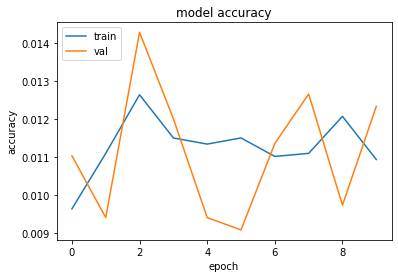

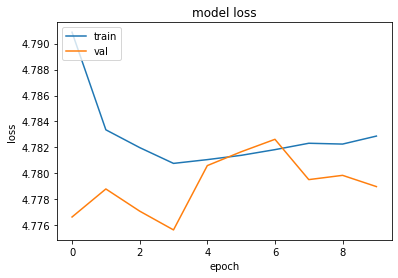

In [165]:
plt.plot(base_model2.history['acc'])
plt.plot(base_model2.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(base_model2.history['loss'])
plt.plot(base_model2.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

# CNN Model for the Group Label

Since the breed labels are doing poorly, we want to check how well the model will work on classifying groups.

As you may notice that we now changed the Y Column from **breed** to **group**.

We are using the same layer we built for our breed.

In [637]:
batch_size = 8
jup_path = '/home/ec2-user/SageMaker/Images'
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=jup_path,
    x_col="image_path",
    y_col="group",
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode="categorical",
    subset='training',
    shuffle=True,
    seed=42
)
valid_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=jup_path,
    x_col="image_path",
    y_col="group",
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode="categorical",
    subset='validation',
    shuffle=True,
    seed=42
)
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    directory=jup_path,
    x_col="image_path",
    target_size=(224, 224),
    batch_size=1,
    class_mode=None,
    shuffle=False,
)

Found 12347 validated image filenames belonging to 9 classes.
Found 3086 validated image filenames belonging to 9 classes.
Found 5145 validated image filenames.


In [638]:
model = Sequential()

model.add(Conv2D(16, (3, 3), padding='same', use_bias=False, input_shape=(224, 224, 3)))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model.add(Dropout(0.2))

model.add(Conv2D(32, (3, 3), padding='same', use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model.add(Dropout(0.2))

model.add(Conv2D(64, (3, 3), padding='same', use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model.add(Dropout(0.2))

model.add(Conv2D(128, (3, 3), padding='same', use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation("relu"))
model.add(Flatten())
model.add(Dropout(0.2))

model.add(Dense(512, activation='relu'))
model.add(Dense(9, activation='softmax'))
model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_26 (Conv2D)           (None, 224, 224, 16)      432       
_________________________________________________________________
batch_normalization_20 (Batc (None, 224, 224, 16)      48        
_________________________________________________________________
activation_25 (Activation)   (None, 224, 224, 16)      0         
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 56, 56, 16)        0         
_________________________________________________________________
dropout_21 (Dropout)         (None, 56, 56, 16)        0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 56, 56, 32)        4608      
_________________________________________________________________
batch_normalization_21 (Batc (None, 56, 56, 32)       

In [ ]:
# EPOCHS = 10

checkpointer = ModelCheckpoint(filepath='/home/ec2-user/SageMaker/weights.best.from_class_base1.hdf5',
                               verbose=1, save_best_only=True)

model.compile(loss='categorical_crossentropy',
             optimizer='adam',
             metrics=['accuracy'])

base_group_model = model.fit(train_generator, 
              validation_data=(train_generator),
              steps_per_epoch = train_generator.n // train_generator.batch_size,
              validation_steps = valid_generator.n // valid_generator.batch_size,
              epochs=EPOCHS, callbacks=[checkpointer], verbose=1)

# Checking Performance for Groups

The accuracy is not bad, we have around 28%, which definitely better than a random guess.

We tried to use different optimizers but the difference is not much.

In [640]:
print('For training set:')
report_accuracy(base_group_model, train_generator)
print('------------------')
print('For validation set:')
report_accuracy(base_group_model, valid_generator)

For training set:
Loss: 1.8766826538687542
Accuracy: 0.28184983
------------------
For validation set:
Loss: 1.910685713118222
Accuracy: 0.25631887


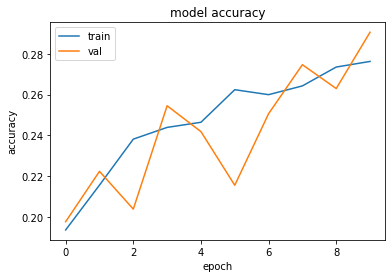

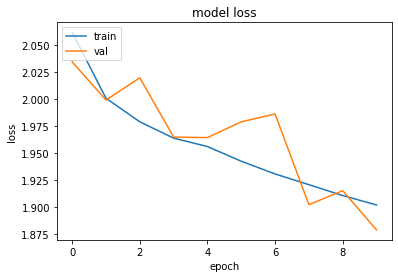

In [641]:
plt.plot(base_group_model.history['acc'])
plt.plot(base_group_model.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(base_group_model.history['loss'])
plt.plot(base_group_model.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [642]:
EPOCHS = 10

checkpointer = ModelCheckpoint(filepath='/home/ec2-user/SageMaker/weights.best.from_class_base1.hdf5',
                               verbose=1, save_best_only=True)

model.compile(loss='categorical_crossentropy',
             optimizer='rmsprop',
             metrics=['accuracy'])

base_group_model2 = model.fit(train_generator, 
              validation_data=(train_generator),
              steps_per_epoch = train_generator.n // train_generator.batch_size,
              validation_steps = valid_generator.n // valid_generator.batch_size,
              epochs=EPOCHS, callbacks=[checkpointer], verbose=1)

Epoch 1/10
 385/1543 [======>.......................] - ETA: 2:00 - loss: 1.8968 - acc: 0.2737
Epoch 00001: val_loss improved from inf to 1.89683, saving model to /home/ec2-user/SageMaker/weights.best.from_class_base1.hdf5
1543/1543 [==============================] - 206s 134ms/step - loss: 1.8940 - acc: 0.2854 - val_loss: 1.8968 - val_acc: 0.2737
Epoch 2/10
 385/1543 [======>.......................] - ETA: 1:59 - loss: 1.8776 - acc: 0.3032
Epoch 00002: val_loss improved from 1.89683 to 1.87762, saving model to /home/ec2-user/SageMaker/weights.best.from_class_base1.hdf5
1543/1543 [==============================] - 203s 132ms/step - loss: 1.9004 - acc: 0.2785 - val_loss: 1.8776 - val_acc: 0.3032
Epoch 3/10
 385/1543 [======>.......................] - ETA: 1:59 - loss: 1.9172 - acc: 0.2578
Epoch 00003: val_loss did not improve from 1.87762
1543/1543 [==============================] - 203s 132ms/step - loss: 1.9022 - acc: 0.2845 - val_loss: 1.9172 - val_acc: 0.2578
Epoch 4/10
 385/1543 [=

In [643]:
print('For training set:')
report_accuracy(base_group_model2, train_generator)
print('------------------')
print('For validation set:')
report_accuracy(base_group_model2, valid_generator)

For training set:
Loss: 1.9128635660045505
Accuracy: 0.2823358
------------------
For validation set:
Loss: 1.9388576115968932
Accuracy: 0.2624757


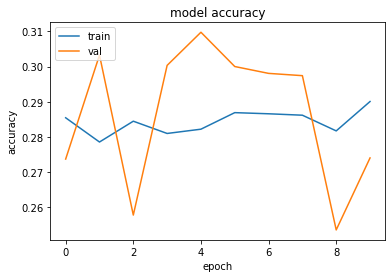

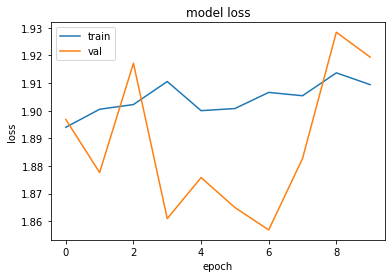

In [646]:
plt.plot(base_group_model2.history['acc'])
plt.plot(base_group_model2.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(base_group_model2.history['loss'])
plt.plot(base_group_model2.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [648]:
target = image.group.unique()
target

array(['Working', 'Non-Sporting', 'Toy', 'Terrier', 'Rare', 'Herding',
       'Sporting', 'Hound', 'Wild'], dtype=object)

In [649]:
Y_pred = model.predict_generator(valid_generator)
y_pred = np.argmax(Y_pred, axis=1)
print('Confusion Matrix')
cf = confusion_matrix(valid_generator.classes, y_pred)
print(cf)
print('Classification Report')
target_names = target
print(classification_report(valid_generator.classes, y_pred, target_names=target_names))

Confusion Matrix
[[  6  70   0   0   2 143  49   2  22]
 [  2 115   0   0   9 260 116   8  53]
 [  1  45   0   0   3 110  44   2  22]
 [  0  18   0   0   0  29  13   0  12]
 [  4  82   1   0   6 213  75   1  44]
 [  6 120   2   0   5 238  86   5  47]
 [  6  95   0   0   7 214  71   2  40]
 [  0  15   0   0   1  30  12   0   9]
 [  3  99   0   0   6 241  90   5  49]]
Classification Report
              precision    recall  f1-score   support

     Working       0.21      0.02      0.04       294
Non-Sporting       0.17      0.20      0.19       563
         Toy       0.00      0.00      0.00       227
     Terrier       0.00      0.00      0.00        72
        Rare       0.15      0.01      0.03       426
     Herding       0.16      0.47      0.24       509
    Sporting       0.13      0.16      0.14       435
       Hound       0.00      0.00      0.00        67
        Wild       0.16      0.10      0.12       493

    accuracy                           0.16      3086
   macro avg 

/home/ec2-user/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ec2-user/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ec2-user/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

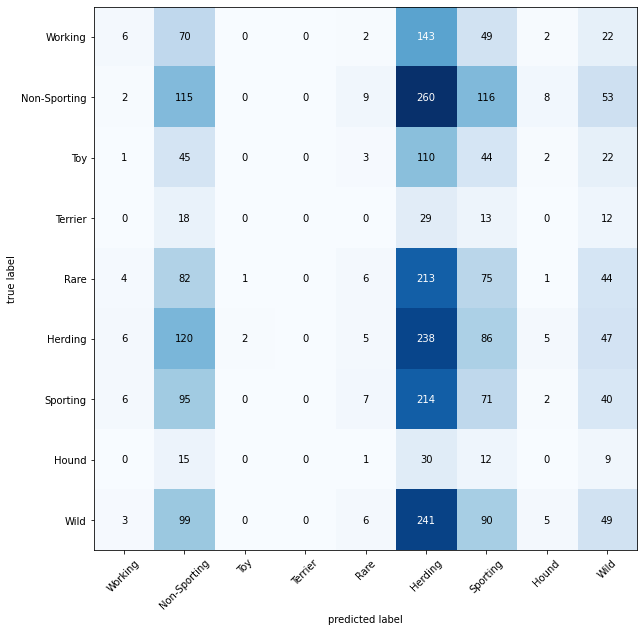

In [650]:
plot_confusion_matrix(conf_mat=cf,
                      class_names=target, 
                      figsize=(10,10));

# Investigate how the model misclassified labels

The Herding group has been classified the most, while the Toy group has the lowest.

In [651]:
img_path = '/home/ec2-user/SageMaker/Images/'

In [696]:
herd = image.loc[(image['group'] == 'Herding')]
non_sport = image.loc[(image['group'] == 'Non-Sporting')]
toy = image.loc[(image['group'] == 'Toy')]

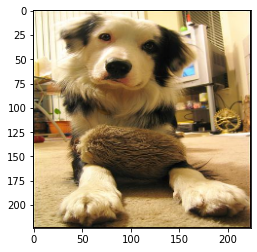

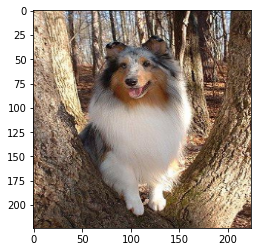

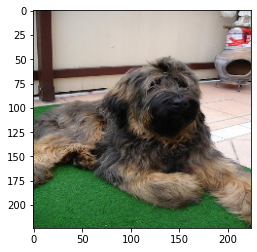

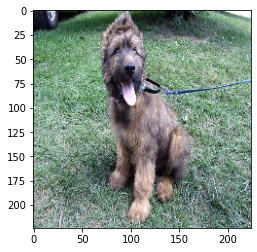

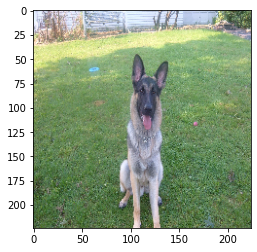

...

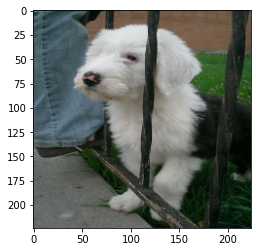

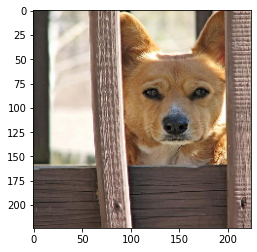

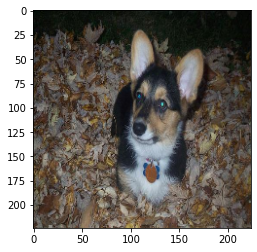

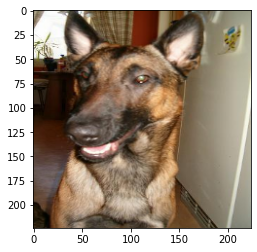

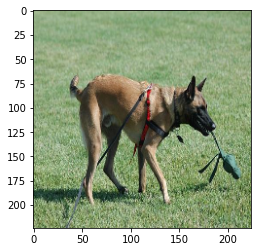

In [693]:
for i in herd['image_path'][::100]:
    test = cv2.imread(img_path + i)
    test = cv2.resize(test, (224, 224))
    test = cv2.cvtColor(test, cv2.COLOR_BGR2RGB)
    imgplot = plt.imshow(test)
    plt.show(imgplot)

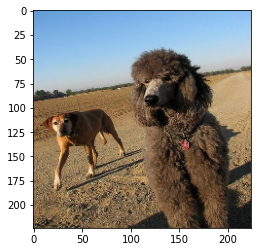

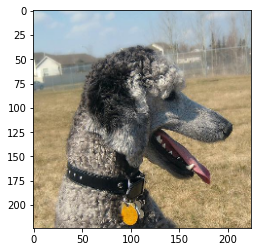

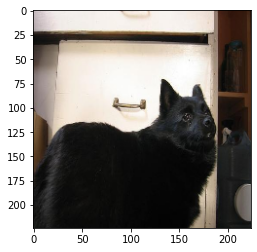

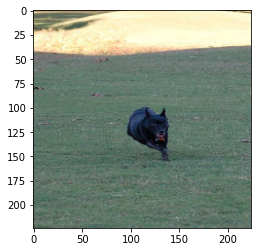

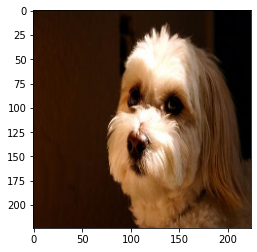

...

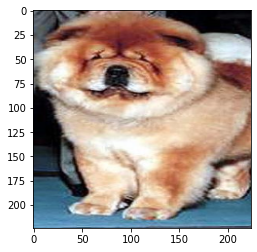

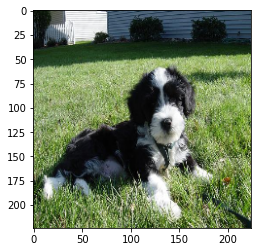

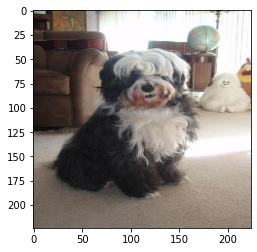

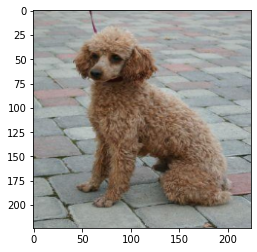

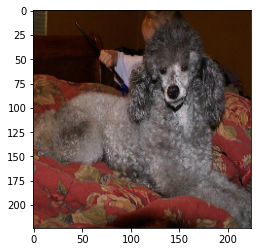

In [695]:
for i in non_sport['image_path'][::100]:
    test = cv2.imread(img_path + i)
    test = cv2.resize(test, (224, 224))
    test = cv2.cvtColor(test, cv2.COLOR_BGR2RGB)
    imgplot = plt.imshow(test)
    plt.show(imgplot)

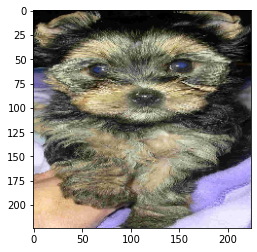

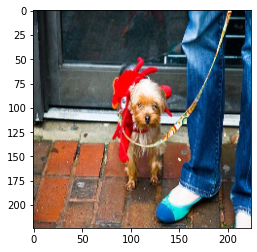

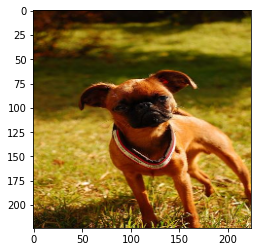

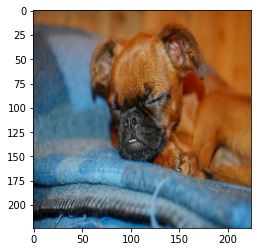

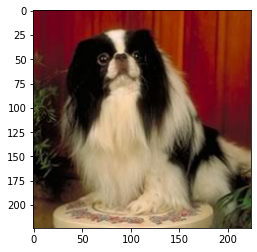

...

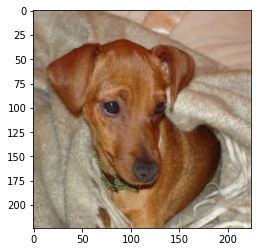

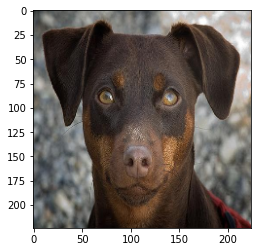

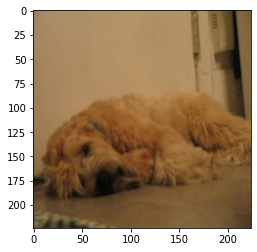

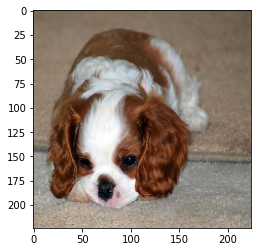

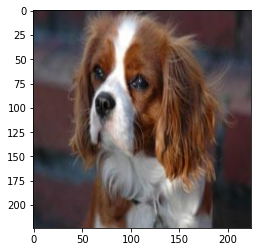

In [697]:
for i in toy['image_path'][::100]:
    test = cv2.imread(img_path + i)
    test = cv2.resize(test, (224, 224))
    test = cv2.cvtColor(test, cv2.COLOR_BGR2RGB)
    imgplot = plt.imshow(test)
    plt.show(imgplot)

# Transfer Learning - VGG16 Model

VGG stands for Very Deep Convolutional Networks, consists of 16 layers, developed in 2014. It is one of the famous models back then in the field of deep learning.

We want to see how well it will perform compared with our baseline model.

In [714]:
#  loading transfer learning model
from tensorflow.keras import applications  

In [704]:
# create the model
vgg_model = applications.VGG16(include_top=False, weights='imagenet')

In [728]:
batch_size = 8
jup_path = '/home/ec2-user/SageMaker/Images/'
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=jup_path,
    x_col="image_path",
    y_col="breed",
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode="categorical",
    subset='training',
    shuffle=True,
    seed=42
)
valid_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=jup_path,
    x_col="image_path",
    y_col="breed",
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode="categorical",
    subset='validation',
    shuffle=True,
    seed=42
)
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    directory=jup_path,
    x_col="image_path",
    target_size=(224, 224),
    batch_size=1,
    class_mode=None,
    shuffle=False,
)

Found 12347 validated image filenames belonging to 120 classes.
Found 3086 validated image filenames belonging to 120 classes.
Found 5145 validated image filenames.


In [749]:
vgg_train = vgg_model.predict(train_generator, verbose=1)
vgg_val = vgg_model.predict(valid_generator, verbose=1)

386/386 [==============================] - 50s 131ms/step


In [708]:
# add the last layer to the VGG model
model = Sequential()
model.add(vgg_model)
model.add(Flatten())  
model.add(Dense(256, activation='relu'))  
model.add(Dropout(0.5))  
model.add(Dense(120, activation='softmax'))

In [709]:
model.compile(optimizer='rmsprop',  
              loss='categorical_crossentropy', metrics=['accuracy'])  

In [710]:
EPOCHS = 10
vgg = model.fit(train_generator, 
              validation_data=(train_generator),
              steps_per_epoch = train_generator.n // train_generator.batch_size,
              validation_steps = valid_generator.n // valid_generator.batch_size,
              epochs=EPOCHS, verbose=1)

Epoch 1/10
1543/1543 [==============================] - 209s 136ms/step - loss: 7.4336 - acc: 0.0105 - val_loss: 4.7784 - val_acc: 0.0123
Epoch 2/10
1543/1543 [==============================] - 208s 135ms/step - loss: 4.8480 - acc: 0.0127 - val_loss: 4.7773 - val_acc: 0.0146
Epoch 3/10
1543/1543 [==============================] - 207s 134ms/step - loss: 4.7951 - acc: 0.0110 - val_loss: 4.7763 - val_acc: 0.0107
Epoch 4/10
1543/1543 [==============================] - 207s 134ms/step - loss: 4.8095 - acc: 0.0145 - val_loss: 4.7773 - val_acc: 0.0153
Epoch 5/10
1543/1543 [==============================] - 208s 135ms/step - loss: 4.7791 - acc: 0.0151 - val_loss: 4.7789 - val_acc: 0.0117
Epoch 6/10
1543/1543 [==============================] - 209s 135ms/step - loss: 4.7804 - acc: 0.0121 - val_loss: 4.7774 - val_acc: 0.0153
Epoch 7/10
1543/1543 [==============================] - 208s 135ms/step - loss: 4.7874 - acc: 0.0136 - val_loss: 4.7778 - val_acc: 0.0120
Epoch 8/10
1543/1543 [============

# Checking VGG Model Performance

The transfer learning, VGG Model did worst compared to our CNN baseline model. 

VGG - 1.2% accuracy vs CNN - 3.5% accuracy

In [711]:
print('For training set:')
report_accuracy(vgg, train_generator)
print('------------------')
print('For validation set:')
report_accuracy(vgg, valid_generator)

For training set:
Loss: 4.7782006659038325
Accuracy: 0.012796631
------------------
For validation set:
Loss: 4.793544256625398
Accuracy: 0.011017499


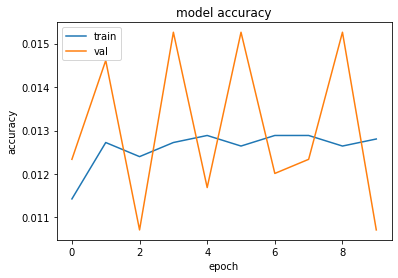

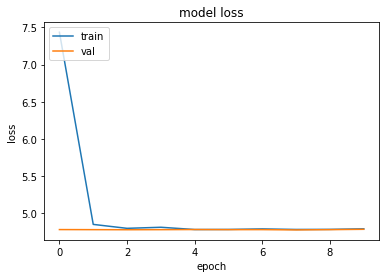

In [712]:
plt.plot(vgg.history['acc'])
plt.plot(vgg.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(vgg.history['loss'])
plt.plot(vgg.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

# Transfer Learning - Inception V3 Model

Inception V3 Model is a pre-trained model on more than a million images, 1,000 classes from the ImageNet database developed by Google. It has stacked layers compare to the traditional CNN model and it is up to 48 layers. V3 here means version 3.

We will see how it will perform.

In [33]:
from tensorflow.keras.applications import inception_v3

In [39]:
batch_size = 8
jup_path = '/home/ec2-user/SageMaker/Images/'
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=jup_path,
    x_col="image_path",
    y_col="breed",
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode="categorical",
    subset='training',
    shuffle=True,
    seed=42
)
valid_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=jup_path,
    x_col="image_path",
    y_col="breed",
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode="categorical",
    subset='validation',
    shuffle=True,
    seed=42
)
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    directory=jup_path,
    x_col="image_path",
    target_size=(224, 224),
    batch_size=1,
    class_mode=None,
    shuffle=False,
)

Found 12347 validated image filenames belonging to 120 classes.
Found 3086 validated image filenames belonging to 120 classes.
Found 5145 validated image filenames.


In [40]:
from tensorflow.keras.utils import to_categorical, model_to_dot, plot_model
num_classes = len(train_generator.class_indices)  
train_labels = train_generator.classes 
train_labels = to_categorical(train_labels, num_classes=num_classes)
valid_labels = valid_generator.classes 
valid_labels = to_categorical(valid_labels, num_classes=num_classes)
nb_train_samples = len(train_generator.filenames)  
nb_valid_samples = len(valid_generator.filenames)

In [41]:
inception_model = inception_v3.InceptionV3(weights='imagenet', include_top=False)

In [42]:
model = Sequential()

for layer in inception_model.layers:
    layer.trainable= False
#     print(layer,layer.trainable)
    
model.add(inception_model)
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.2))
model.add(Dense(120,activation='softmax'))
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Model)         (None, None, None, 2048)  21802784  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 120)               245880    
Total params: 22,048,664
Trainable params: 245,880
Non-trainable params: 21,802,784
_________________________________________________________________


In [43]:
model.compile(optimizer='rmsprop',  
              loss='categorical_crossentropy', metrics=['accuracy'])  

In [44]:
EPOCHS = 10
incept = model.fit(train_generator, 
                    steps_per_epoch = nb_train_samples//batch_size,
                    validation_data = valid_generator, 
                    validation_steps = nb_valid_samples//batch_size,
                    epochs = EPOCHS,
                    verbose = 1)

Epoch 1/10
1543/1543 [==============================] - 274s 178ms/step - loss: 2.7802 - acc: 0.3554 - val_loss: 1.9702 - val_acc: 0.7029
Epoch 2/10
1543/1543 [==============================] - 228s 148ms/step - loss: 2.2255 - acc: 0.4839 - val_loss: 2.2595 - val_acc: 0.7192
Epoch 3/10
1543/1543 [==============================] - 225s 146ms/step - loss: 2.2398 - acc: 0.5112 - val_loss: 2.4868 - val_acc: 0.7312
Epoch 4/10
1543/1543 [==============================] - 230s 149ms/step - loss: 2.2579 - acc: 0.5282 - val_loss: 2.9167 - val_acc: 0.7198
Epoch 5/10
1543/1543 [==============================] - 224s 145ms/step - loss: 2.3423 - acc: 0.5361 - val_loss: 2.9434 - val_acc: 0.7328
Epoch 6/10
1543/1543 [==============================] - 223s 144ms/step - loss: 2.3546 - acc: 0.5475 - val_loss: 3.2083 - val_acc: 0.7325
Epoch 7/10
1543/1543 [==============================] - 221s 143ms/step - loss: 2.4044 - acc: 0.5534 - val_loss: 3.4329 - val_acc: 0.7273
Epoch 8/10
1543/1543 [============

# Check Performance for Inception V3 Model

As we can see below that the Inception V3 model reaches its accuracy to 73% to 75% surprisingly. More importantly, the model is not done with the training. We can always increase the number of epoch for improvement. 

In [47]:
print('For training set:')
report_accuracy(incept, train_generator)
print('------------------')
print('For validation set:')
report_accuracy(incept,valid_generator)

For training set:
Loss: 3.0573402153720206
Accuracy: 0.75581115
------------------
For validation set:
Loss: 3.71907747693474
Accuracy: 0.7300713


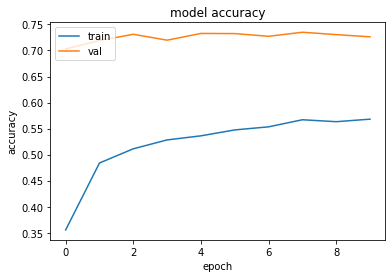

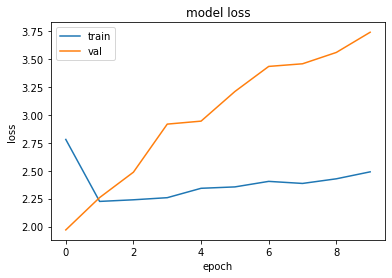

In [48]:
plt.plot(incept.history['acc'])
plt.plot(incept.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(incept.history['loss'])
plt.plot(incept.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [49]:
target = list(image.breed.unique())

In [53]:
Y_pred = model.predict_generator(valid_generator)
y_pred = np.argmax(Y_pred, axis=1)
print('Confusion Matrix')
cf = confusion_matrix(valid_generator.classes, y_pred)
print(cf)
print('Classification Report')
target_names = target
print(classification_report(valid_generator.classes, y_pred, target_names=target_names))

Confusion Matrix
[[38  0  0 ...  0  0  0]
 [ 0 27  0 ...  0  0  0]
 [ 0  0 23 ...  0  0  0]
 ...
 [ 0  0  0 ... 10  0  0]
 [ 0  0  0 ...  0 11  0]
 [ 0  0  0 ...  0  0 16]]
Classification Report
                                precision    recall  f1-score   support

                         boxer       0.88      0.88      0.88        43
               standard_poodle       0.96      0.90      0.93        30
          Bernese_mountain_dog       0.92      0.79      0.85        29
             Yorkshire_terrier       0.59      0.46      0.52        28
                Dandie_Dinmont       0.57      0.54      0.55        24
              Mexican_hairless       0.61      0.76      0.68        33
                    Rottweiler       0.88      0.94      0.91        31
                  bull_mastiff       0.58      0.93      0.72        30
               Tibetan_mastiff       0.78      0.90      0.84        40
                        collie       0.50      0.92      0.65        13
            

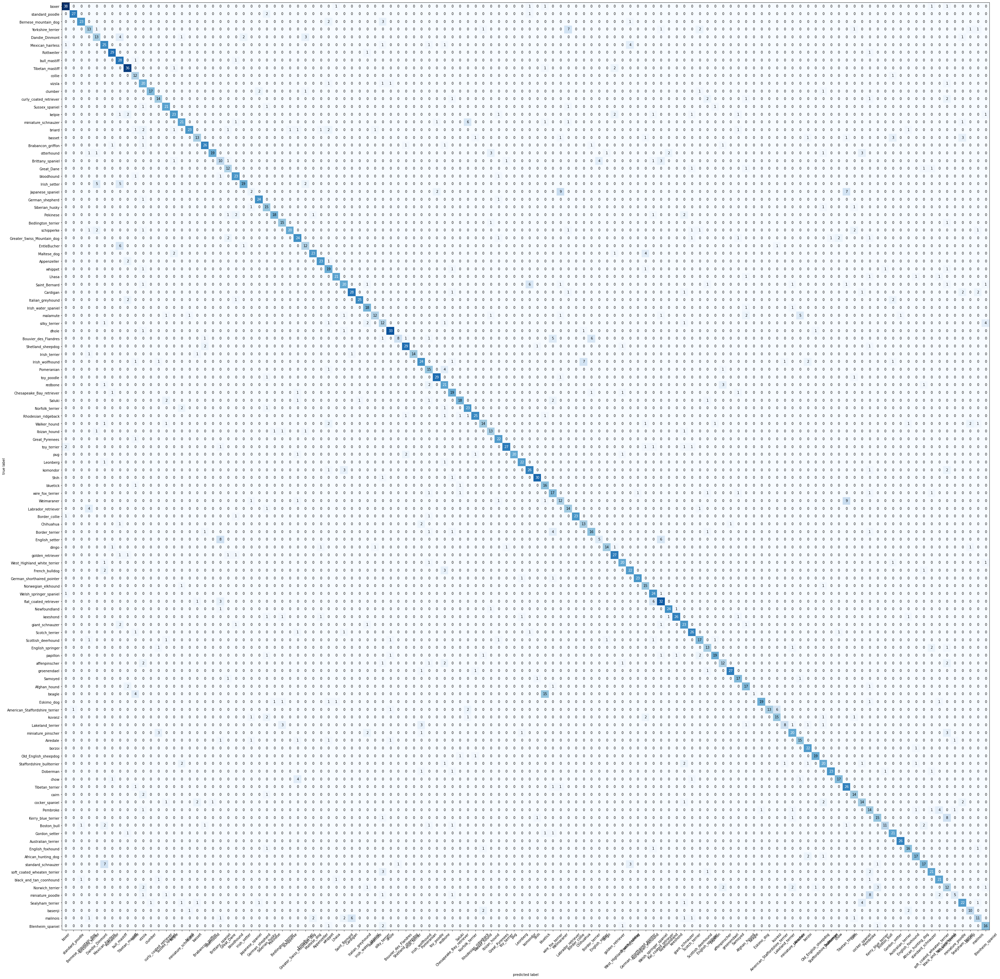

In [54]:
plot_confusion_matrix(conf_mat=cf,
                      class_names=target, 
                      figsize=(50,50));

# Inception V3 Model for Groups Label

In [55]:
batch_size = 8
jup_path = '/home/ec2-user/SageMaker/Images/'
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=jup_path,
    x_col="image_path",
    y_col="group",
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode="categorical",
    subset='training',
    shuffle=True,
    seed=42
)
valid_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=jup_path,
    x_col="image_path",
    y_col="group",
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode="categorical",
    subset='validation',
    shuffle=True,
    seed=42
)
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    directory=jup_path,
    x_col="image_path",
    y_col=None,
    target_size=(224, 224),
    batch_size=1,
    class_mode=None,
    shuffle=False,
)

Found 12347 validated image filenames belonging to 9 classes.
Found 3086 validated image filenames belonging to 9 classes.
Found 5145 validated image filenames.


In [56]:
model = Sequential()

for layer in inception_model.layers:
    layer.trainable= False
#     print(layer,layer.trainable)
    
model.add(inception_model)
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.2))
model.add(Dense(9, activation='softmax'))
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Model)         (None, None, None, 2048)  21802784  
_________________________________________________________________
global_average_pooling2d_2 ( (None, 2048)              0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 9)                 18441     
Total params: 21,821,225
Trainable params: 18,441
Non-trainable params: 21,802,784
_________________________________________________________________


In [57]:
model.compile(optimizer='rmsprop',  
              loss='categorical_crossentropy', metrics=['accuracy'])  

In [58]:
EPOCHS = 10
incept = model.fit(train_generator, 
                    steps_per_epoch = nb_train_samples//batch_size,
                    validation_data = valid_generator, 
                    validation_steps = nb_valid_samples//batch_size,
                    epochs = EPOCHS,
                    verbose = 1)

Epoch 1/10
1543/1543 [==============================] - 232s 150ms/step - loss: 1.4501 - acc: 0.4893 - val_loss: 0.9505 - val_acc: 0.7695
Epoch 2/10
1543/1543 [==============================] - 225s 146ms/step - loss: 1.3093 - acc: 0.5554 - val_loss: 0.8594 - val_acc: 0.7971
Epoch 3/10
1543/1543 [==============================] - 228s 148ms/step - loss: 1.2911 - acc: 0.5611 - val_loss: 1.0325 - val_acc: 0.7714
Epoch 4/10
1543/1543 [==============================] - 226s 146ms/step - loss: 1.2856 - acc: 0.5674 - val_loss: 0.9454 - val_acc: 0.7951
Epoch 5/10
1543/1543 [==============================] - 224s 145ms/step - loss: 1.2646 - acc: 0.5749 - val_loss: 0.9106 - val_acc: 0.7938
Epoch 6/10
1543/1543 [==============================] - 226s 147ms/step - loss: 1.2719 - acc: 0.5801 - val_loss: 0.9941 - val_acc: 0.7870
Epoch 7/10
1543/1543 [==============================] - 227s 147ms/step - loss: 1.2794 - acc: 0.5740 - val_loss: 0.9574 - val_acc: 0.7994
Epoch 8/10
1543/1543 [============

# Check Performance for Inception V3 Model (Groups)

Similarly, the Inception V3 model increase dramatically compares to our CNN model. It reaches 80% accuracy.

In [59]:
print('For training set:')
report_accuracy(incept, train_generator)
print('------------------')
print('For validation set:')
report_accuracy(incept,valid_generator)

For training set:
Loss: 0.9024185325833874
Accuracy: 0.8075646
------------------
For validation set:
Loss: 0.9491798921569354
Accuracy: 0.81432277


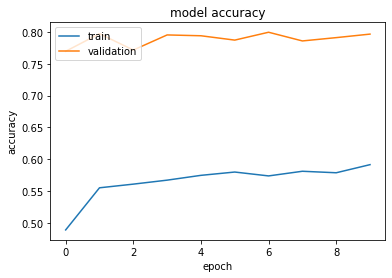

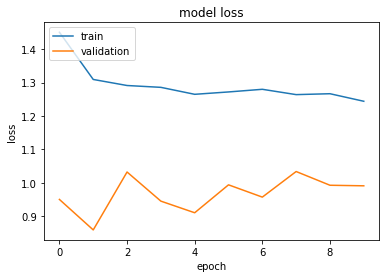

In [60]:
plt.plot(incept.history['acc'])
plt.plot(incept.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(incept.history['loss'])
plt.plot(incept.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

# Making Prediction with Our Test Dataset

We didn't have a chance to use our Test Dataset since the other models didn't perform well. But finally, we got a model that we feel satisfied and we can test that with our test dataset.

The result comes pretty well too, in which we have 4230 images predicted correctly and 915 images predicted incorrectly. 

In [65]:
test_generator.reset()
pred=model.predict_generator(test_generator,
                             steps=test_generator.n//test_generator.batch_size,
                             verbose=1)

5145/5145 [==============================] - 178s 35ms/step


In [66]:
predicted_class_indices=np.argmax(pred,axis=1)
labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
predictions = [labels[k] for k in predicted_class_indices]

In [70]:
filenames=test_generator.filenames
results=pd.DataFrame({"filename":filenames,
                      "prediction":predictions})

In [72]:
test_result = pd.merge(left=image, right=results, left_on='image_path', right_on='filename')

In [73]:
test_result = test_result.drop(['filename'], axis=1)

In [74]:
test_result['Compare'] = np.where(test_result['group'] == test_result['prediction'],'Correct','Not Correct')

In [75]:
correct = test_result[test_result['Compare'] == 'Correct']
not_correct = test_result[test_result['Compare'] != 'Correct']

In [76]:
correct

,image_path,breed,group,prediction,Compare
0,n02108089-boxer/n02108089_9076.jpg,boxer,Working,Working,Correct
1,n02108089-boxer/n02108089_8739.jpg,boxer,Working,Working,Correct
3,n02108089-boxer/n02108089_1619.jpg,boxer,Working,Working,Correct
4,n02108089-boxer/n02108089_7259.jpg,boxer,Working,Working,Correct
6,n02108089-boxer/n02108089_10901.jpg,boxer,Working,Working,Correct
...,...,...,...,...,...
5140,n02086646-Blenheim_spaniel/n02086646_4045.jpg,Blenheim_spaniel,Toy,Toy,Correct
5141,n02086646-Blenheim_spaniel/n02086646_166.jpg,Blenheim_spaniel,Toy,Toy,Correct
5142,n02086646-Blenheim_spaniel/n02086646_3688.jpg,Blenheim_spaniel,Toy,Toy,Correct
5143,n02086646-Blenheim_spaniel/n02086646_2498.jpg,Blenheim_spaniel,Toy,Toy,Correct


In [77]:
not_correct

,image_path,breed,group,prediction,Compare
2,n02108089-boxer/n02108089_1410.jpg,boxer,Working,Non-Sporting,Not Correct
5,n02108089-boxer/n02108089_5301.jpg,boxer,Working,Terrier,Not Correct
7,n02108089-boxer/n02108089_13839.jpg,boxer,Working,Terrier,Not Correct
12,n02108089-boxer/n02108089_1072.jpg,boxer,Working,Hound,Not Correct
15,n02108089-boxer/n02108089_6429.jpg,boxer,Working,Terrier,Not Correct
...,...,...,...,...,...
5124,n02086646-Blenheim_spaniel/n02086646_3536.jpg,Blenheim_spaniel,Toy,Sporting,Not Correct
5128,n02086646-Blenheim_spaniel/n02086646_1920.jpg,Blenheim_spaniel,Toy,Sporting,Not Correct
5129,n02086646-Blenheim_spaniel/n02086646_1182.jpg,Blenheim_spaniel,Toy,Sporting,Not Correct
5136,n02086646-Blenheim_spaniel/n02086646_2621.jpg,Blenheim_spaniel,Toy,Sporting,Not Correct


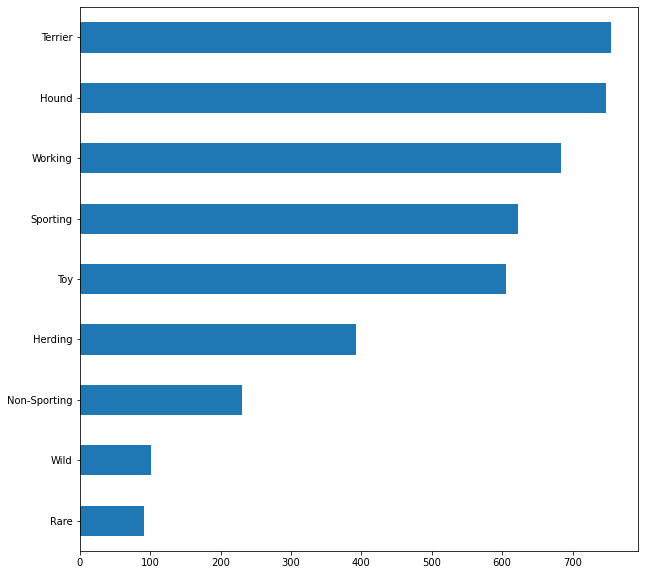

In [78]:
correct['group'].value_counts().sort_values(ascending=True).plot.barh(figsize=(10,10));

# To Show Images with Correct and Not Correct Prediction

In [80]:
def predict_and_show(file):
    img = Image.open(file)
    plt.imshow(img)
    plt.show()

boxer - Working


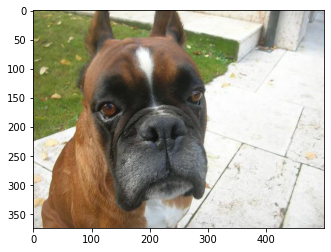

clumber - Sporting


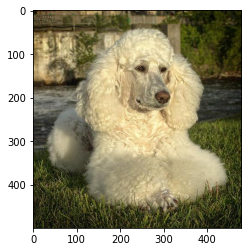

Japanese_spaniel - Toy


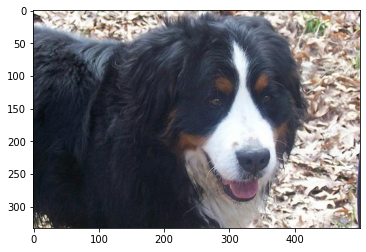

Saint_Bernard - Working


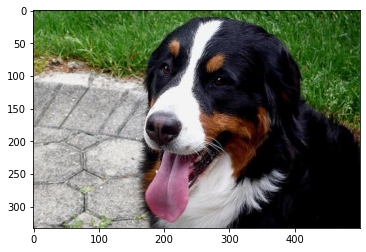

Pomeranian - Toy


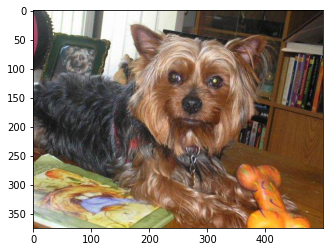

Leonberg - Working


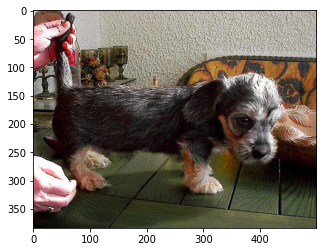

dingo - Wild


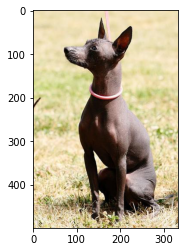

Scottish_deerhound - Hound


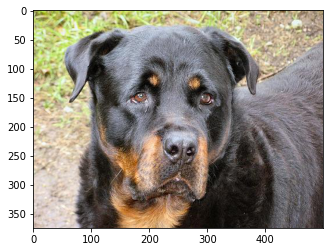

kuvasz - Working


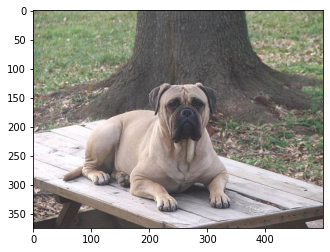

cairn - Terrier


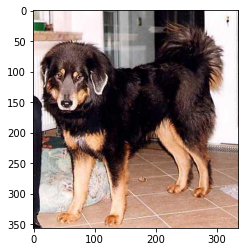

Norwich_terrier - Terrier


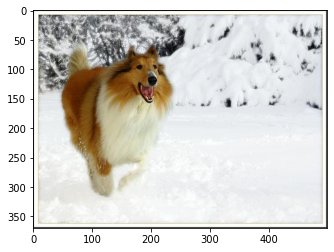

In [82]:
img_path = '/home/ec2-user/SageMaker/Images/'
for breed, group, path in zip(correct.breed[::400], correct.group[::400], correct.image_path[::30]):
    print(breed + ' - ' + group)
    predict_and_show(img_path + path)

In [83]:
not_correct

,image_path,breed,group,prediction,Compare
2,n02108089-boxer/n02108089_1410.jpg,boxer,Working,Non-Sporting,Not Correct
5,n02108089-boxer/n02108089_5301.jpg,boxer,Working,Terrier,Not Correct
7,n02108089-boxer/n02108089_13839.jpg,boxer,Working,Terrier,Not Correct
12,n02108089-boxer/n02108089_1072.jpg,boxer,Working,Hound,Not Correct
15,n02108089-boxer/n02108089_6429.jpg,boxer,Working,Terrier,Not Correct
...,...,...,...,...,...
5124,n02086646-Blenheim_spaniel/n02086646_3536.jpg,Blenheim_spaniel,Toy,Sporting,Not Correct
5128,n02086646-Blenheim_spaniel/n02086646_1920.jpg,Blenheim_spaniel,Toy,Sporting,Not Correct
5129,n02086646-Blenheim_spaniel/n02086646_1182.jpg,Blenheim_spaniel,Toy,Sporting,Not Correct
5136,n02086646-Blenheim_spaniel/n02086646_2621.jpg,Blenheim_spaniel,Toy,Sporting,Not Correct


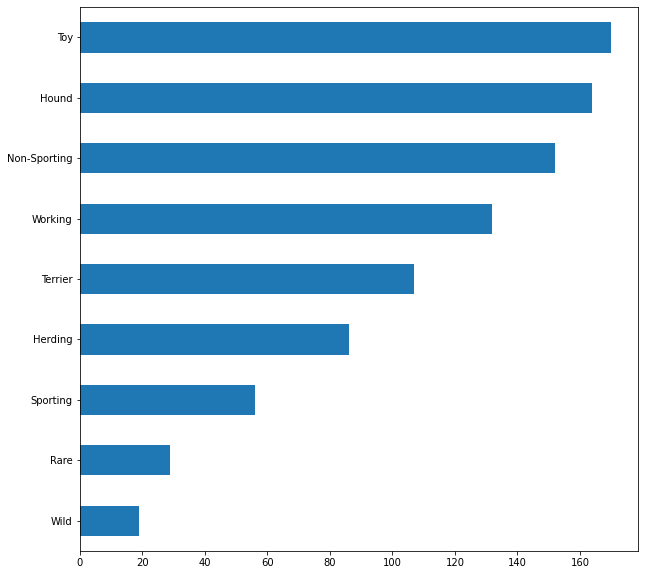

In [84]:
not_correct['group'].value_counts().sort_values(ascending=True).plot.barh(figsize=(10,10));

boxer - Actual Working vs Predict Non-Sporting


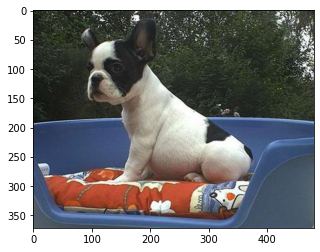

miniature_schnauzer - Actual Terrier vs Predict Working


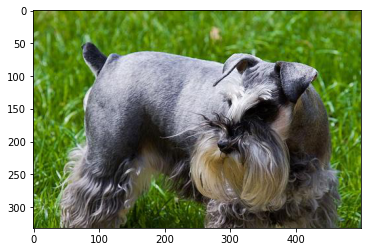

schipperke - Actual Non-Sporting vs Predict Rare


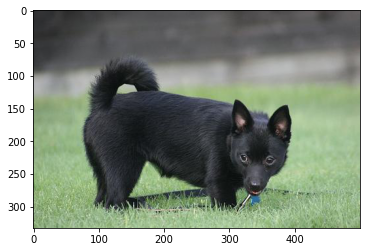

whippet - Actual Hound vs Predict Toy


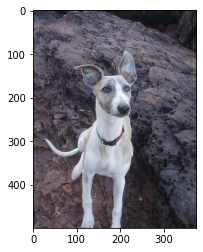

toy_poodle - Actual Toy vs Predict Non-Sporting


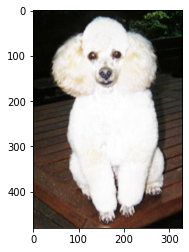

pug - Actual Toy vs Predict Working


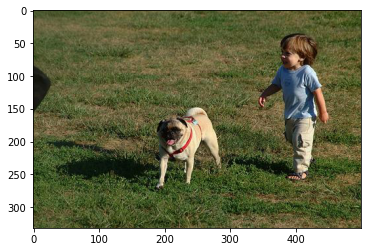

dingo - Actual Wild vs Predict Herding


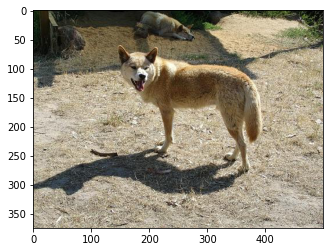

Scotch_terrier - Actual Terrier vs Predict Working


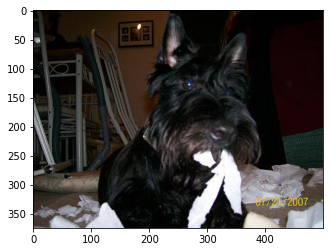

miniature_pinscher - Actual Toy vs Predict Terrier


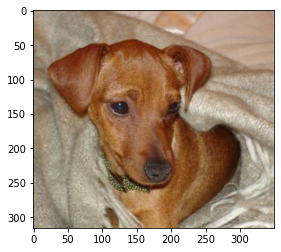

Australian_terrier - Actual Terrier vs Predict Hound


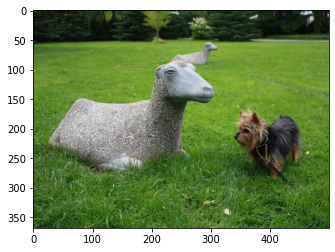

basenji - Actual Hound vs Predict Rare


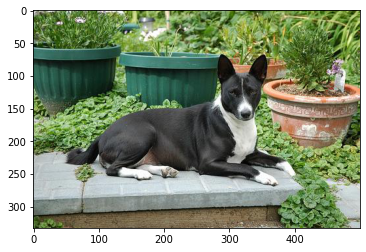

In [86]:
for breed, group, prediction, path in zip(not_correct.breed[::90], 
                                          not_correct.group[::90], 
                                          not_correct.prediction[::90],
                                          not_correct.image_path[::90]):
    print(f'{breed} - Actual {group} vs Predict {prediction}')
    predict_and_show(img_path + path)

# Confusion Matrix

In [36]:
target = list(image.group.unique())

In [37]:
Y_pred = model.predict_generator(valid_generator)
y_pred = np.argmax(Y_pred, axis=1)
print('Confusion Matrix')
cf = confusion_matrix(valid_generator.classes, y_pred)
print(cf)
print('Classification Report')
target_names = target
print(classification_report(valid_generator.classes, y_pred, target_names=target_names))

Confusion Matrix
[[207   4   6  24   2   9   2   0  15]
 [ 16 400   8   9  14  21   2   4  42]
 [  8   1 176   2   1  11  14   0  36]
 [  9   4   1  54   0   2   2   1   5]
 [  1  25   6   0 308   8   8   0  37]
 [  3   6   8   3   2 408  21   0  46]
 [ 17   2  27   3   6  42 390   0  26]
 [  4   4   0   3   0   0   0  56   2]
 [ 11  18   8  14   8  22   8   0 413]]
Classification Report
              precision    recall  f1-score   support

     Working       0.75      0.77      0.76       269
Non-Sporting       0.86      0.78      0.82       516
         Toy       0.73      0.71      0.72       249
     Terrier       0.48      0.69      0.57        78
        Rare       0.90      0.78      0.84       393
     Herding       0.78      0.82      0.80       497
    Sporting       0.87      0.76      0.81       513
       Hound       0.92      0.81      0.86        69
        Wild       0.66      0.82      0.73       502

    accuracy                           0.78      3086
   macro avg 

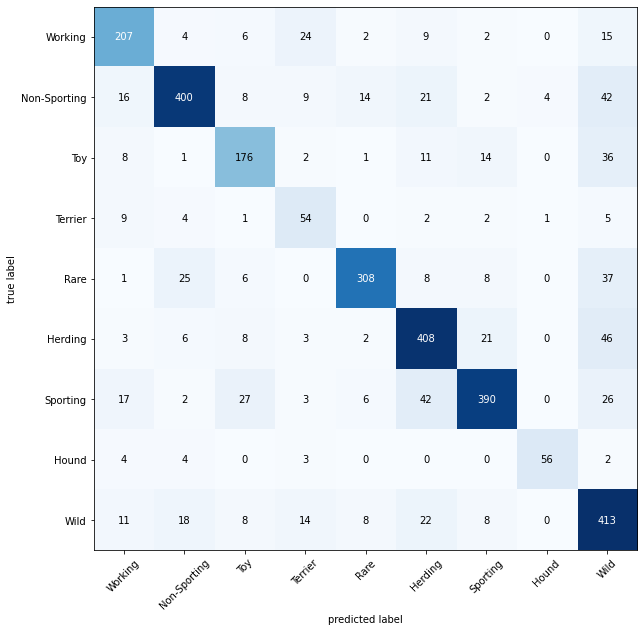

In [38]:
plot_confusion_matrix(conf_mat=cf,
                      class_names=target, 
                      figsize=(10,10));

# Making Prediction

We want to see how the prediction work.

The two images we are comparing are Chihuahua and Mexican Hairless, which both images look very similar even from a human perspective, so the model did make sense here.

Also, I included two images from my friend that she is going to adopt, which is a breed that did not appear in our dataset. It is impossible for our model to have the correct prediction. Also, base on the feedback, we can see that different angels taking the images will come out with a different result. 

But from a business perspective, we can make the assumption that it is a mix, and the answer is a mix.

Answer: **Formosan Mountain Dog Terrier mix**

In [87]:
from tensorflow.python.keras.preprocessing.image import load_img, img_to_array

image_size = 224
def read_and_prep_images(img_paths, img_height=image_size, img_width=image_size):
    imgs = [load_img(img_path, target_size=(img_height, img_width)) for img_path in img_paths]
    img_array = np.array([img_to_array(img) for img in imgs])
    return preprocess_input(img_array)

In [89]:
image.head()

,image_path,breed,group
0,n02108089-boxer/n02108089_11616.jpg,boxer,Working
0,n02108089-boxer/n02108089_9045.jpg,boxer,Working
0,n02108089-boxer/n02108089_9076.jpg,boxer,Working
0,n02108089-boxer/n02108089_3028.jpg,boxer,Working
0,n02108089-boxer/n02108089_3162.jpg,boxer,Working


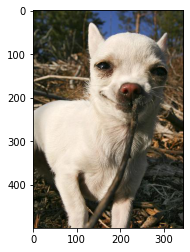

In [90]:
predict_and_show('/home/ec2-user/SageMaker/Images/n02085620-Chihuahua/n02085620_1073.jpg')

In [91]:
from keras.preprocessing.image import load_img, img_to_array
pic_dog = '/home/ec2-user/SageMaker/Images/n02085620-Chihuahua/n02085620_1073.jpg'
pic_dog = load_img(pic_dog,target_size=(224,224))
pic_dog = img_to_array(pic_dog)
pic_dog = pic_dog/255
pic_dog = pic_dog.reshape(1,224,224,3)
result = model.predict(pic_dog)
# print(result)
count = 0
for i in result[0]:
    percent = '%.2f%%'%(i*100)
    print("{} -- probablity：{}".format(files[count], percent))
    count += 1

n02108089-boxer -- probablity：0.01%
n02113799-standard_poodle -- probablity：0.03%
n02107683-Bernese_mountain_dog -- probablity：0.33%
n02094433-Yorkshire_terrier -- probablity：0.00%
n02096437-Dandie_Dinmont -- probablity：0.11%
n02113978-Mexican_hairless -- probablity：97.63%
n02106550-Rottweiler -- probablity：1.87%
n02108422-bull_mastiff -- probablity：0.00%
n02108551-Tibetan_mastiff -- probablity：0.01%


Using TensorFlow backend.


In [92]:
hairless = image.loc[(image['breed'] == 'Mexican_hairless')]

In [93]:
hairless

,image_path,breed,group
0,n02113978-Mexican_hairless/n02113978_468.jpg,Mexican_hairless,Rare
0,n02113978-Mexican_hairless/n02113978_183.jpg,Mexican_hairless,Rare
0,n02113978-Mexican_hairless/n02113978_1823.jpg,Mexican_hairless,Rare
0,n02113978-Mexican_hairless/n02113978_1030.jpg,Mexican_hairless,Rare
0,n02113978-Mexican_hairless/n02113978_3419.jpg,Mexican_hairless,Rare
...,...,...,...
0,n02113978-Mexican_hairless/n02113978_1957.jpg,Mexican_hairless,Rare
0,n02113978-Mexican_hairless/n02113978_124.jpg,Mexican_hairless,Rare
0,n02113978-Mexican_hairless/n02113978_505.jpg,Mexican_hairless,Rare
0,n02113978-Mexican_hairless/n02113978_356.jpg,Mexican_hairless,Rare


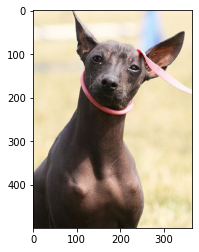

In [154]:
predict_and_show('/home/ec2-user/SageMaker/Images/n02113978-Mexican_hairless/n02113978_124.jpg')

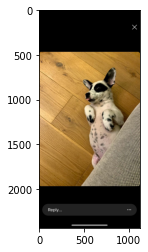

In [96]:
predict_and_show('/home/ec2-user/SageMaker/IMG_1061.jpeg')

In [97]:
pic_dog = '/home/ec2-user/SageMaker/IMG_1061.jpeg'
pic_dog = load_img(pic_dog,target_size=(224,224))
pic_dog = img_to_array(pic_dog)
pic_dog = pic_dog/255
pic_dog = pic_dog.reshape(1,224,224,3)
result = model.predict(pic_dog)

count = 0
for i in result[0]:
    percent = '%.2f%%'%(i*100)
    print("{} -- probablity：{}".format(files[count], percent))
    count += 1

n02108089-boxer -- probablity：0.95%
n02113799-standard_poodle -- probablity：0.00%
n02107683-Bernese_mountain_dog -- probablity：0.13%
n02094433-Yorkshire_terrier -- probablity：0.00%
n02096437-Dandie_Dinmont -- probablity：0.54%
n02113978-Mexican_hairless -- probablity：0.07%
n02106550-Rottweiler -- probablity：55.70%
n02108422-bull_mastiff -- probablity：0.00%
n02108551-Tibetan_mastiff -- probablity：42.60%


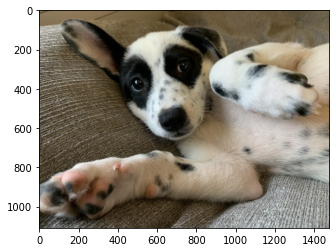

In [98]:
predict_and_show('/home/ec2-user/SageMaker/IMG_5547.tiff')

In [99]:
pic_dog = '/home/ec2-user/SageMaker/IMG_5547.tiff'
pic_dog = load_img(pic_dog,target_size=(224,224))
pic_dog = img_to_array(pic_dog)
pic_dog = pic_dog/255
pic_dog = pic_dog.reshape(1,224,224,3)
result = model.predict(pic_dog)

count = 0
for i in result[0]:
    percent = '%.2f%%'%(i*100)
    print("{} -- probablity：{}".format(files[count], percent))
    count += 1

n02108089-boxer -- probablity：97.92%
n02113799-standard_poodle -- probablity：0.00%
n02107683-Bernese_mountain_dog -- probablity：0.00%
n02094433-Yorkshire_terrier -- probablity：0.00%
n02096437-Dandie_Dinmont -- probablity：0.00%
n02113978-Mexican_hairless -- probablity：0.00%
n02106550-Rottweiler -- probablity：0.00%
n02108422-bull_mastiff -- probablity：0.00%
n02108551-Tibetan_mastiff -- probablity：2.08%
